In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import preprocessing
from statsmodels.tsa.ar_model import AutoReg
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA

In [ ]:
df = pd.read_csv("EEG_data.csv")
#usunięcie zbędnych kolumn z dataframe'u
df_waves = df.iloc[:, 5:12]
df_students_video = df.iloc[:, 0:2]
df_significant_cols = pd.concat([df_students_video, df_waves], axis=1)

In [ ]:
#podzielenie dataframe'u na kilka osobnych df dla każdego studenta
list_of_students = []
for i in range(10):
  list_of_students.append(pd.DataFrame(data=df_significant_cols.loc[df['SubjectID'] == i]))

In [ ]:
#wydzielenie dataframe'ów każdego studenta dla jednego filmu
list_of_students_with_one_video = []
for i in range(10):
   list_of_students_with_one_video.append(pd.DataFrame(data=list_of_students[i].loc[df['VideoID'] == 5]))
len(list_of_students_with_one_video)

10

In [ ]:
#skrócenie sygnałów z jednego wideo do 100 próbek (ponieważ niektóre sygnały są dłuższe)
cut_list_student = []
for i in range(10):
  cut_list_student.append(list_of_students_with_one_video[i][:100])

# Wyciągnięcie wszystkich sygnałów

In [ ]:
stud_0 = []
stud_1 = []
stud_2 = []
stud_3 = []
stud_4 = []
stud_5 = []
stud_6 = []
stud_7 = []
stud_8 = []
stud_9 = []

columns = ["Delta", "Theta", "Alpha1", "Alpha2", "Beta1", "Beta2", "Gamma1"]

for i in columns:
  stud_0.append(cut_list_student[0][i].apply(lambda x: float(x)))
  stud_1.append(cut_list_student[1][i].apply(lambda x: float(x)))
  stud_2.append(cut_list_student[2][i].apply(lambda x: float(x)))
  stud_3.append(cut_list_student[3][i].apply(lambda x: float(x)))
  stud_4.append(cut_list_student[4][i].apply(lambda x: float(x)))
  stud_5.append(cut_list_student[5][i].apply(lambda x: float(x)))
  stud_6.append(cut_list_student[6][i].apply(lambda x: float(x)))
  stud_7.append(cut_list_student[7][i].apply(lambda x: float(x)))
  stud_8.append(cut_list_student[8][i].apply(lambda x: float(x)))
  stud_9.append(cut_list_student[9][i].apply(lambda x: float(x)))

len(stud_0) #delta od 10 studentów, po 100 próbek na studenta
print(stud_8[2])

10932     22725.0
10933     13017.0
10934     89513.0
10935      8222.0
10936     18010.0
           ...   
11027     85492.0
11028     32850.0
11029    122106.0
11030    207655.0
11031     87368.0
Name: Alpha1, Length: 100, dtype: float64


In [ ]:
#zamiana na array
list_st0 = []
list_st1 = []
list_st2 = []
list_st3 = []
list_st4 = []
list_st5 = []
list_st6 = []
list_st7 = []
list_st8 = []
list_st9 = []

for i in range(7):
  x0 = np.array([stud_0[i]])
  x1 = np.array([stud_1[i]])
  x2 = np.array([stud_2[i]])
  x3 = np.array([stud_3[i]])
  x4 = np.array([stud_4[i]])
  x5 = np.array([stud_5[i]])
  x6 = np.array([stud_6[i]])
  x7 = np.array([stud_7[i]])
  x8 = np.array([stud_8[i]])
  x9 = np.array([stud_9[i]])
  list_st0.append(x0)
  list_st1.append(x1)
  list_st2.append(x2)
  list_st3.append(x3)
  list_st4.append(x4)
  list_st5.append(x5)
  list_st6.append(x6)
  list_st7.append(x7)
  list_st8.append(x8)
  list_st9.append(x9)


#zamiana listy 3d na listę 2d
st0 = [e for sl in list_st0 for e in sl]
st1 = [e for sl in list_st1 for e in sl]
st2 = [e for sl in list_st2 for e in sl]
st3 = [e for sl in list_st3 for e in sl]
st4 = [e for sl in list_st4 for e in sl]
st5 = [e for sl in list_st5 for e in sl]
st6 = [e for sl in list_st6 for e in sl]
st7 = [e for sl in list_st7 for e in sl]
st8 = [e for sl in list_st8 for e in sl]
st9 = [e for sl in list_st9 for e in sl]

len(st0) #po 5 ndarrayów na każdą deltę od każdego studenta = 50
st8[2]

array([ 22725.,  13017.,  89513.,   8222.,  18010., 132974.,  10478.,
        35298.,  36555.,  52070.,   1557.,  44430.,  13304.,  19124.,
        89008., 104314.,  83258.,  15308., 140769.,  31461., 252463.,
        85431., 157843., 164385.,  53105.,  51135.,   3018.,  55780.,
        23767.,  61174., 137105., 223040., 235084., 323160.,  44077.,
       180412.,  64323.,   9425.,  48522.,  17691., 224799., 318828.,
       129132.,  69912.,  33241.,   7646.,  24681., 289596.,  89251.,
        74520.,  26598.,  71713.,  43375.,  49463.,  41117., 178993.,
        50585., 159520., 144456., 179898.,  50034.,  56943.,  79750.,
        10577.,  52330.,   2099.,  58781., 296057., 220506.,  26584.,
        20647.,   1765., 121671., 107748.,  29799., 633801., 163020.,
        10216.,  30465.,  17827.,  94999.,  26246.,  36942.,  50324.,
         8111.,  52772., 109188.,  43697.,  10141.,  50577.,  89743.,
        47212.,  31514.,  91193., 103324.,  85492.,  32850., 122106.,
       207655.,  873

No handles with labels found to put in legend.


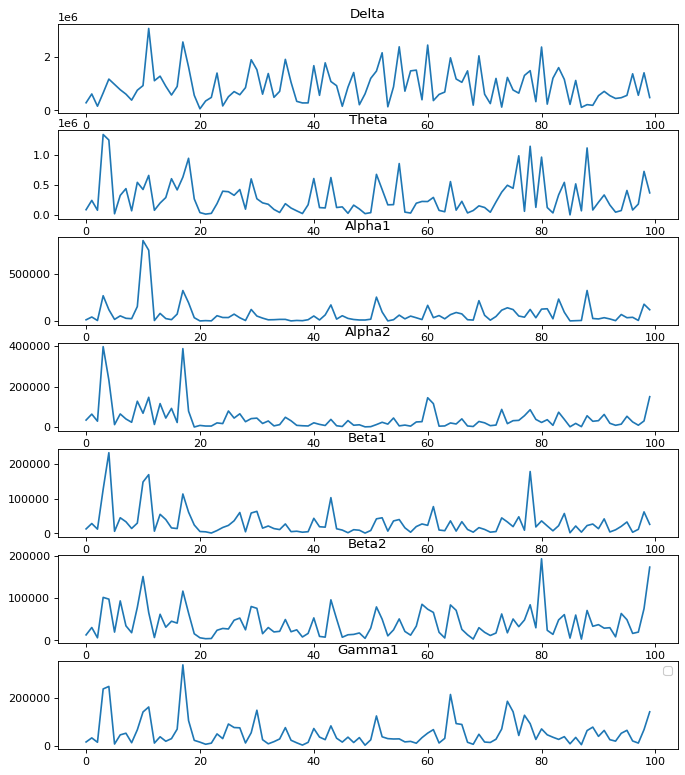

In [ ]:
plt.figure(figsize=(10, 12), dpi=80)

for i in range(7):
  plt.subplot(7, 1, i+1)
  plt.plot(st0[i])
  plt.title(columns[i])

plt.legend(framealpha=1, frameon=True);

#Funkcje normalizacji i metryki

In [ ]:
def normalise_to_max_1(signal):
  norm = [float(i)/max(signal) for i in signal]
  return norm

def normalise_0_to_1(signal):
  norm = (signal - np.min(signal))/np.ptp(signal)
  return norm

def snr(before_denoising, denoised):
  x = sum([so**2 for so in before_denoising])/len(before_denoising)
  y = sum([(so-sn)**2 for so, sn in zip(before_denoising, denoised)])/len(before_denoising)
  snr = 10*np.log10(x/y)
  return snr

def psnr(before_denoising, denoised):
  mse = np.mean((before_denoising - denoised) ** 2)
  max_pixel = 1.0
  psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
  return psnr

#AR

In [ ]:
def wykonaj_AR(signal):
  ar_model = AutoReg(signal, lags=[1, 11, 12])
  ar_res = ar_model.fit()
  pred = ar_res.predict(start=0, end=len(signal))
  return pred

def draw_result(norm, pred, signal_name):
  plt.figure(figsize=(10, 1), dpi=80)
  plt.title(signal_name)
  plt.plot(norm, label='Oryginalny sygnał')
  plt.plot(pred, label='Sygnał po AR')
  plt.legend(framealpha=1, frameon=True)

def get_metrics(norm, pred):
  snr_fragment = round(snr(norm, pred),1)
  mse = round(mean_squared_error(norm[0:len(pred)], pred[0:len(norm)]), 3)
  psnr_val = round(psnr(norm[0:len(pred)], pred[0:len(norm)]),1)
  return mse, snr_fragment, psnr_val

def flip(pred):
  signal_minusOne_to_one = 2.*(pred - np.min(pred))/np.ptp(pred)-1
  reverse = [ -i for i in signal_minusOne_to_one ]
  reverse_zero_to_one = (reverse - np.min(reverse))/np.ptp(reverse)
  return reverse_zero_to_one

def print_results(mse, snr, psnr):
  print("MSE: ", mse)
  print("\nSNR: ", snr)
  print("\nPSNR: ", psnr)


def My_AR(signal, signal_name):
  print("\n")
  print(signal_name)

  #normalizuj sygnał do maksymalnej wartości 1.0
  norm = normalise_to_max_1(signal)

  #wykonaj AR
  pred = wykonaj_AR(norm)

  #normalizuj otrzymany z AR sygał
  norm_AR = normalise_0_to_1(pred)
  
  #porównanie wyników predykcji AR z odwróconą predykcją AR
  mse, snr, psnr = get_metrics(norm, norm_AR)
  mse_best, snr_best, psnr_best = mse, snr, psnr
  if snr<0:
    norm_AR = flip(norm_AR)
    mse2, snr2, psnr2 = get_metrics(norm, norm_AR)
    mse_best, snr_best, psnr_best = mse2, snr2, psnr2
    if snr2<snr:
      norm_AR = flip(norm_AR)
      mse_best, snr_best, psnr_best = get_metrics(norm, norm_AR)

  print_results(mse_best, snr_best, psnr_best)
  draw_result(norm, norm_AR, signal_name)

##AR dla jednego studenta



Delta
MSE:  0.021

SNR:  8.5

PSNR:  16.7


Theta
MSE:  0.016

SNR:  8.3

PSNR:  17.9


Alpha1
MSE:  0.012

SNR:  4.5

PSNR:  19.2


Alpha2
MSE:  0.025

SNR:  2.3

PSNR:  16.0


Beta1
MSE:  0.037

SNR:  1.4

PSNR:  14.3


Beta2
MSE:  0.042

SNR:  3.4

PSNR:  13.8


Gamma1
MSE:  0.071

SNR:  -0.5

PSNR:  11.5


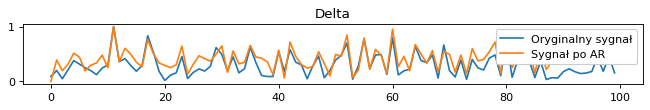

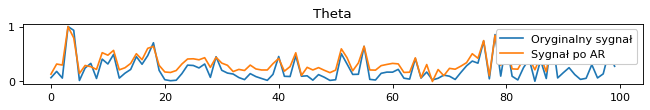

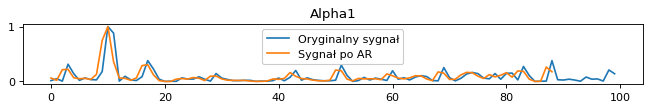

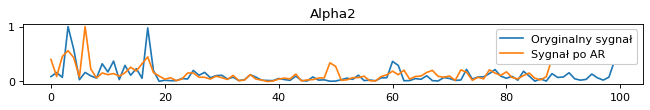

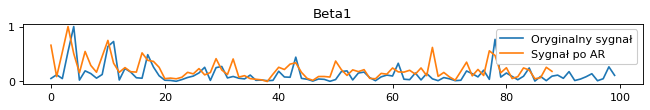

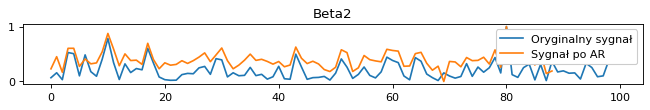

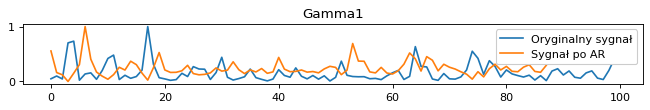

In [ ]:
for i in range(7):
  My_AR(st9[i], columns[i])

##AR dla wszystkich studentów



Delta
MSE:  0.021

SNR:  8.5

PSNR:  16.7


Theta
MSE:  0.016

SNR:  8.3

PSNR:  17.9


Alpha1
MSE:  0.012

SNR:  4.5

PSNR:  19.2


Alpha2
MSE:  0.025

SNR:  2.3

PSNR:  16.0


Beta1
MSE:  0.037

SNR:  1.4

PSNR:  14.3


Beta2
MSE:  0.042

SNR:  3.4

PSNR:  13.8


Gamma1
MSE:  0.071

SNR:  -0.5

PSNR:  11.5


Delta
MSE:  0.1

SNR:  -0.8

PSNR:  10.0


Theta
MSE:  0.056

SNR:  -2.0

PSNR:  12.5


Alpha1
MSE:  0.119

SNR:  -5.1

PSNR:  9.3


Alpha2
MSE:  0.04

SNR:  -1.5

PSNR:  14.0


Beta1
MSE:  0.045

SNR:  -0.5

PSNR:  13.5


Beta2
MSE:  0.037

SNR:  -0.0

PSNR:  14.3


Gamma1
MSE:  0.036

SNR:  -1.8

PSNR:  14.4


Delta
MSE:  0.051

SNR:  -2.4

PSNR:  12.9


Theta
MSE:  0.1

SNR:  -6.1

PSNR:  10.0


Alpha1
MSE:  0.011

SNR:  1.6

PSNR:  19.6


Alpha2
MSE:  0.039

SNR:  -2.0

PSNR:  14.1


Beta1
MSE:  0.079

SNR:  -4.5

PSNR:  11.0


Beta2
MSE:  0.022

SNR:  3.5

PSNR:  16.5


Gamma1
MSE:  0.127

SNR:  -3.8

PSNR:  9.0


Delta
MSE:  0.013

SNR:  11.7

PSNR:  18.8


Theta


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

MSE:  0.162

SNR:  -1.7

PSNR:  7.9


Alpha1
MSE:  0.018

SNR:  5.7

PSNR:  17.5


Alpha2
MSE:  0.103

SNR:  -3.8

PSNR:  9.9


Beta1
MSE:  0.023

SNR:  3.4

PSNR:  16.3


Beta2
MSE:  0.066

SNR:  3.0

PSNR:  11.8


Gamma1
MSE:  0.012

SNR:  11.0

PSNR:  19.3


Delta
MSE:  0.164

SNR:  -3.8

PSNR:  7.9


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin



Theta
MSE:  0.195

SNR:  -6.4

PSNR:  7.1


Alpha1
MSE:  0.053

SNR:  -1.1

PSNR:  12.8


Alpha2
MSE:  0.079

SNR:  -1.8

PSNR:  11.1


Beta1
MSE:  0.036

SNR:  1.1

PSNR:  14.4


Beta2
MSE:  0.037

SNR:  2.8

PSNR:  14.3


Gamma1
MSE:  0.021

SNR:  5.6

PSNR:  16.9


Delta
MSE:  0.007

SNR:  13.9

PSNR:  21.9



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Theta
MSE:  0.157

SNR:  -2.0

PSNR:  8.1


Alpha1
MSE:  0.007

SNR:  8.6

PSNR:  21.8


Alpha2
MSE:  0.025

SNR:  2.7

PSNR:  16.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin



Beta1
MSE:  0.005

SNR:  9.8

PSNR:  23.4


Beta2
MSE:  0.019

SNR:  4.2

PSNR:  17.3


Gamma1
MSE:  0.08

SNR:  0.4

PSNR:  11.0


Delta
MSE:  0.013

SNR:  11.1

PSNR:  18.8


Theta
MSE:  0.026

SNR:  2.7

PSNR:  15.8


Alpha1
MSE:  0.119

SNR:  -1.9

PSNR:  9.3


Alpha2
MSE:  0.078

SNR:  -0.5

PSNR:  11.1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin



Beta1
MSE:  0.097

SNR:  1.9

PSNR:  10.1


Beta2
MSE:  0.082

SNR:  3.2

PSNR:  10.9


Gamma1
MSE:  0.079

SNR:  2.3

PSNR:  11.0


Delta
MSE:  0.056

SNR:  3.7

PSNR:  12.5


Theta
MSE:  0.091

SNR:  0.7

PSNR:  10.4


Alpha1
MSE:  0.096

SNR:  -1.1

PSNR:  10.2


Alpha2
MSE:  0.119

SNR:  -4.5

PSNR:  9.2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin



Beta1
MSE:  0.141

SNR:  -2.7

PSNR:  8.5


Beta2
MSE:  0.046

SNR:  4.4

PSNR:  13.4


Gamma1
MSE:  0.053

SNR:  0.9

PSNR:  12.8


Delta
MSE:  0.064

SNR:  5.6

PSNR:  11.9


Theta
MSE:  0.107

SNR:  -0.4

PSNR:  9.7


Alpha1
MSE:  0.079

SNR:  -2.4

PSNR:  11.0


Alpha2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

MSE:  0.063

SNR:  -2.9

PSNR:  12.0


Beta1
MSE:  0.142

SNR:  -3.4

PSNR:  8.5


Beta2
MSE:  0.108

SNR:  -0.8

PSNR:  9.7


Gamma1
MSE:  0.174

SNR:  -8.8

PSNR:  7.6


Delta
MSE:  0.021

SNR:  8.5

PSNR:  16.7


Theta
MSE:  0.016

SNR:  8.3

PSNR:  17.9


Alpha1
MSE:  0.012

SNR:  4.5

PSNR:  19.2


Alpha2
MSE:  0.025

SNR:  2.3

PSNR:  16.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin



Beta1
MSE:  0.037

SNR:  1.4

PSNR:  14.3


Beta2
MSE:  0.042

SNR:  3.4

PSNR:  13.8


Gamma1
MSE:  0.071

SNR:  -0.5

PSNR:  11.5


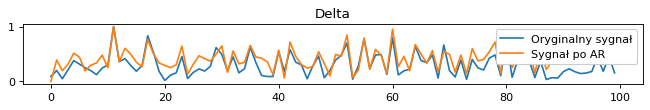

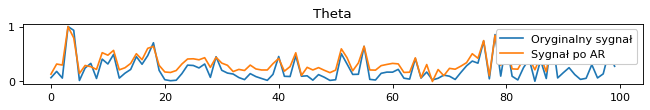

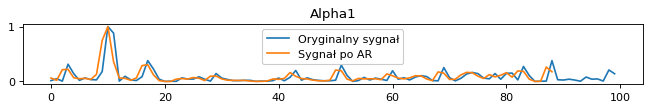

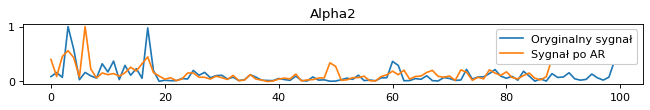

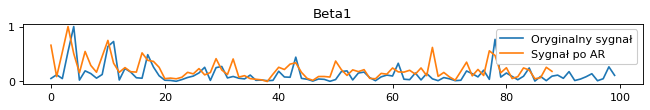

...

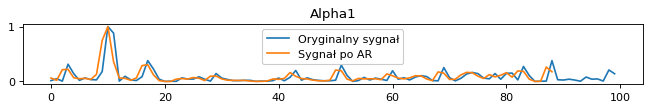

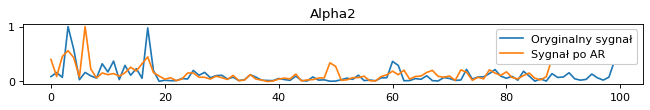

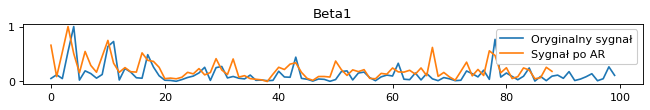

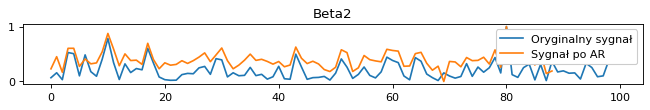

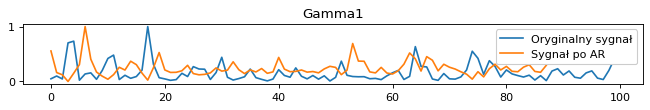

In [ ]:
all_students = []
all_students.append(st0)
all_students.append(st1)
all_students.append(st2)
all_students.append(st3)
all_students.append(st4)
all_students.append(st5)
all_students.append(st6)
all_students.append(st7)
all_students.append(st8)
all_students.append(st9)

for i in range(10):
  for x in range(7):
    My_AR(all_students[i][x], columns[x])


# PCA

In [ ]:
stud_0 = []
stud_1 = []
stud_2 = []
stud_3 = []
stud_4 = []
stud_5 = []
stud_6 = []
stud_7 = []
stud_8 = []
stud_9 = []
for i in columns:
  stud_0.append(cut_list_student[0][i].apply(lambda x: float(x)).tolist())
  stud_1.append(cut_list_student[1][i].apply(lambda x: float(x)).tolist())
  stud_2.append(cut_list_student[2][i].apply(lambda x: float(x)).tolist())
  stud_3.append(cut_list_student[3][i].apply(lambda x: float(x)).tolist())
  stud_4.append(cut_list_student[4][i].apply(lambda x: float(x)).tolist())
  stud_5.append(cut_list_student[5][i].apply(lambda x: float(x)).tolist())
  stud_6.append(cut_list_student[6][i].apply(lambda x: float(x)).tolist())
  stud_7.append(cut_list_student[7][i].apply(lambda x: float(x)).tolist())
  stud_8.append(cut_list_student[8][i].apply(lambda x: float(x)).tolist())
  stud_9.append(cut_list_student[9][i].apply(lambda x: float(x)).tolist())

In [ ]:
#cięcie danych
def cut_data(students):
  students_cut = []
  for i in range(7):
    for j in range(0,100,20):
      students_cut.append(students[i][j:j+20])
  return students_cut

student0_cut = cut_data(stud_0)  
student1_cut = cut_data(stud_1)  
student2_cut = cut_data(stud_2)  
student3_cut = cut_data(stud_3)  
student4_cut = cut_data(stud_4)  
student5_cut = cut_data(stud_5)  
student6_cut = cut_data(stud_6)  
student7_cut = cut_data(stud_7)  
student8_cut = cut_data(stud_8)  
student9_cut = cut_data(stud_9)  

In [ ]:
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
import math

def snr(b_d, d):
  x = sum([so**2 for so in b_d])/len(b_d)
  y = sum([(so-sn)**2 for so, sn in zip(b_d, d)])/len(b_d)
  snr = 10*np.log10(x/y)
  snr = round(snr, 6)
  return snr
  
def mse(b_d, d):
  mse = mean_squared_error(b_d, d)
  mse = round(mse, 6)
  return mse

def psnr(original, compressed):
    mse = np.mean((np.array(original) - np.array(compressed) ** 2))
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

def wykonaj_PCA(signal, n_components):
  pca = PCA()
  pca = pca.fit(signal)

  pca = PCA(n_components=n_components).fit(signal)
  components = pca.transform(signal)
  pred = pca.inverse_transform(components)

  signal_ravel = np.concatenate(signal).ravel().tolist()
  pca_signal_ravel = np.concatenate(pred).ravel().tolist()


  norm_signal = [float(i)/max(signal_ravel) for i in signal_ravel]
  norm_pca_signal = [float(i)/max(pca_signal_ravel) for i in pca_signal_ravel]


  plt.figure(figsize=(15, 15), dpi=80)

  plt.subplot(7,1,1)
  plt.plot(norm_signal[:100])
  plt.plot(norm_pca_signal[:100])
  plt.title('Delta')
  plt.legend(["Przed PCA", "Po PCA"])


  plt.subplot(7,1,2)
  plt.plot(norm_signal[100:200])
  plt.plot(norm_pca_signal[100:200])
  plt.title('Theta')


  plt.subplot(7,1,3)
  plt.plot(norm_signal[200:300])
  plt.plot(norm_pca_signal[200:300])
  plt.title('Alpha1')


  plt.subplot(7,1,4)
  plt.plot(norm_signal[300:400])
  plt.plot(norm_pca_signal[300:400])
  plt.title('Alpha2')


  plt.subplot(7,1,5)
  plt.plot(norm_signal[400:500])
  plt.plot(norm_pca_signal[400:500])
  plt.title('Beta1')


  plt.subplot(7,1,6)
  plt.plot(norm_signal[500:600])
  plt.plot(norm_pca_signal[500:600])
  plt.title('Beta2')


  plt.subplot(7,1,7)
  plt.plot(norm_signal[600:700])
  plt.plot(norm_pca_signal[600:700])
  plt.title('Gamma1')


  plt.xlim()
  plt.tight_layout()
  
  print("Metryki dla sygnału Delta:")
  print("MSE:", round(mse(norm_signal[:100], norm_pca_signal[:100]),3))
  print("SNR:", round(snr(norm_signal[:100], norm_pca_signal[:100]),3))
  print("PSNR:", round(psnr(norm_signal[:100], norm_pca_signal[:100]),3))
  print("Metryki dla sygnału Theta:")
  print("MSE:", round(mse(norm_signal[100:200], norm_pca_signal[100:200]),3))
  print("SNR:", round(snr(norm_signal[100:200], norm_pca_signal[100:200]),3))
  print("PSNR:", round(psnr(norm_signal[100:200], norm_pca_signal[100:200]),3))
  print("Metryki dla sygnału Alpha1:")
  print("MSE:", round(mse(norm_signal[200:300], norm_pca_signal[200:300]),3))
  print("SNR:", round(snr(norm_signal[200:300], norm_pca_signal[200:300]),3))
  print("PSNR:", round(psnr(norm_signal[200:300], norm_pca_signal[200:300]),3))
  print("Metryki dla sygnału Alpha2:")
  print("MSE:", round(mse(norm_signal[300:400], norm_pca_signal[300:400]),3))
  print("SNR:", round(snr(norm_signal[300:400], norm_pca_signal[300:400]),3))
  print("PSNR:", round(psnr(norm_signal[300:400], norm_pca_signal[300:400]),3))
  print("Metryki dla sygnału Beta1:")
  print("MSE:", round(mse(norm_signal[400:500], norm_pca_signal[400:500]),3))
  print("SNR:", round(snr(norm_signal[400:500], norm_pca_signal[400:500]),3))
  print("PSNR:", round(psnr(norm_signal[400:500], norm_pca_signal[400:500]),3))
  print("Metryki dla sygnału Beta2:")
  print("MSE:", round(mse(norm_signal[500:600], norm_pca_signal[500:600]),3))
  print("SNR:", round(snr(norm_signal[500:600], norm_pca_signal[500:600]),3))
  print("PSNR:", round(psnr(norm_signal[500:600], norm_pca_signal[500:600]),3))
  print("Metryki dla sygnału Gamma1:")
  print("MSE:", round(mse(norm_signal[600:700], norm_pca_signal[600:700]),3))
  print("SNR:", round(snr(norm_signal[600:700], norm_pca_signal[600:700]),3))
  print("PSNR:", round(psnr(norm_signal[600:700], norm_pca_signal[600:700]),3))

## PCA dla jednego studenta

Metryki dla sygnału Delta:
MSE: 0.009
SNR: 11.551
PSNR: 55.606
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.647
PSNR: 58.78
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.29
PSNR: 64.408
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.663
PSNR: 66.746
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.262
PSNR: 68.221
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 4.477
PSNR: 66.923
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 4.593
PSNR: 65.695


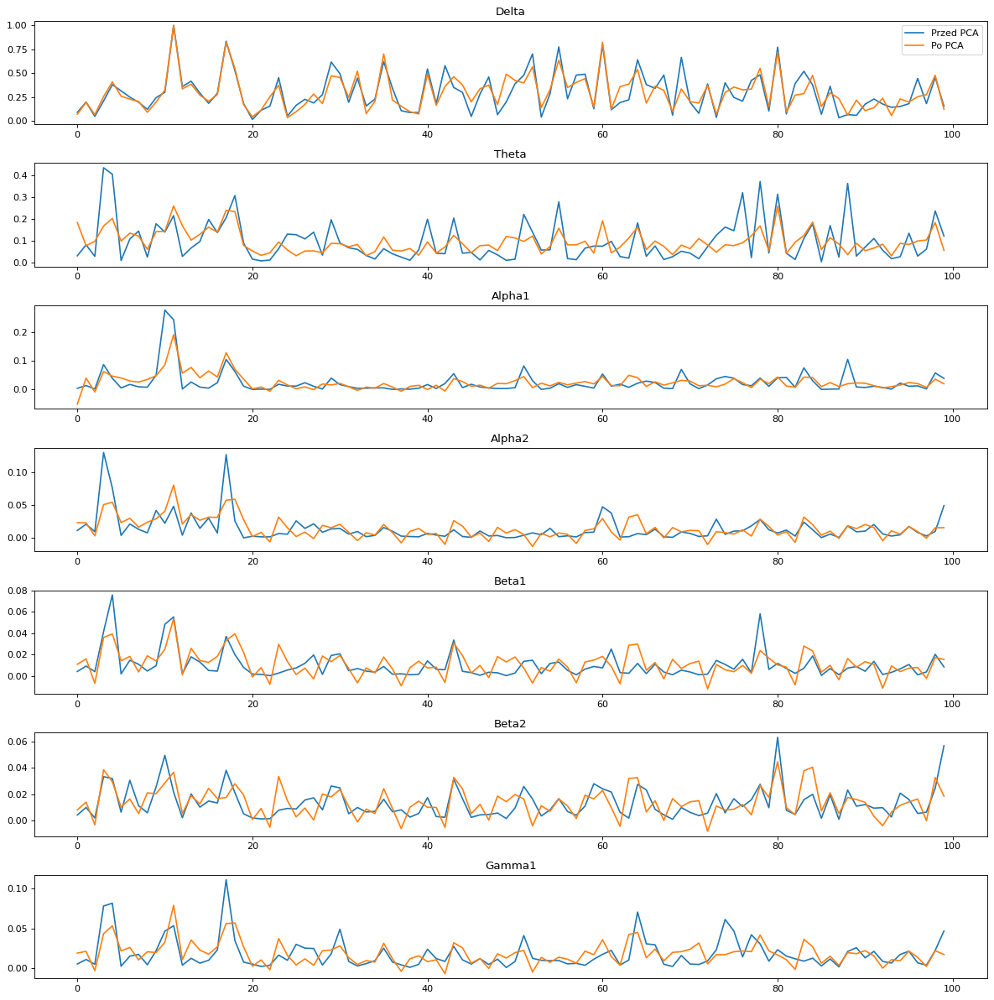

In [ ]:
wykonaj_PCA(student0_cut, 3)

## PCA dla wszystkich studentów

Metryki dla sygnału Delta:
MSE: 0.009
SNR: 11.551
PSNR: 55.606
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.647
PSNR: 58.78
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.29
PSNR: 64.408
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.663
PSNR: 66.746
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.262
PSNR: 68.221
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 4.477
PSNR: 66.923
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 4.593
PSNR: 65.695


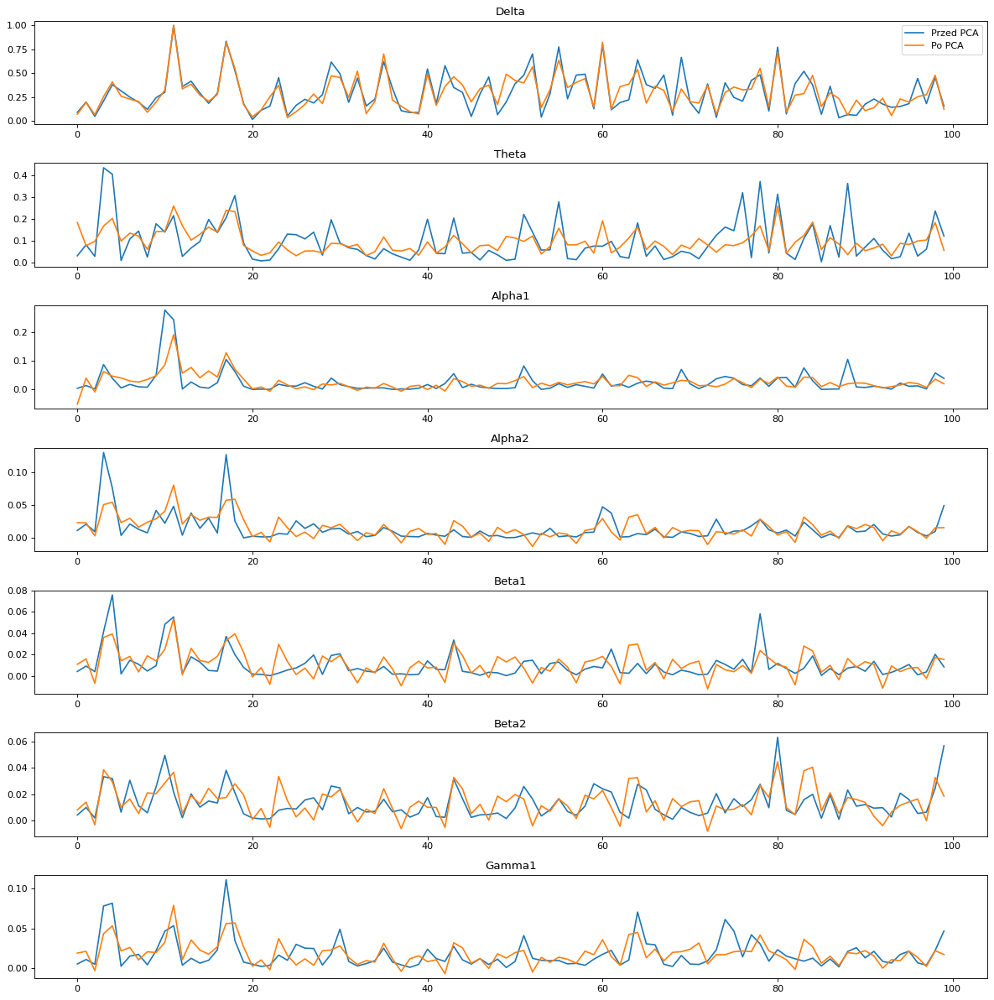

In [ ]:
wykonaj_PCA(student0_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.006
SNR: 10.904
PSNR: 58.363
Metryki dla sygnału Theta:
MSE: 0.002
SNR: 4.026
PSNR: 61.909
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 3.994
PSNR: 67.381
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.793
PSNR: 67.869
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 4.416
PSNR: 68.706
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 2.498
PSNR: 69.861
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 0.095
PSNR: 71.941


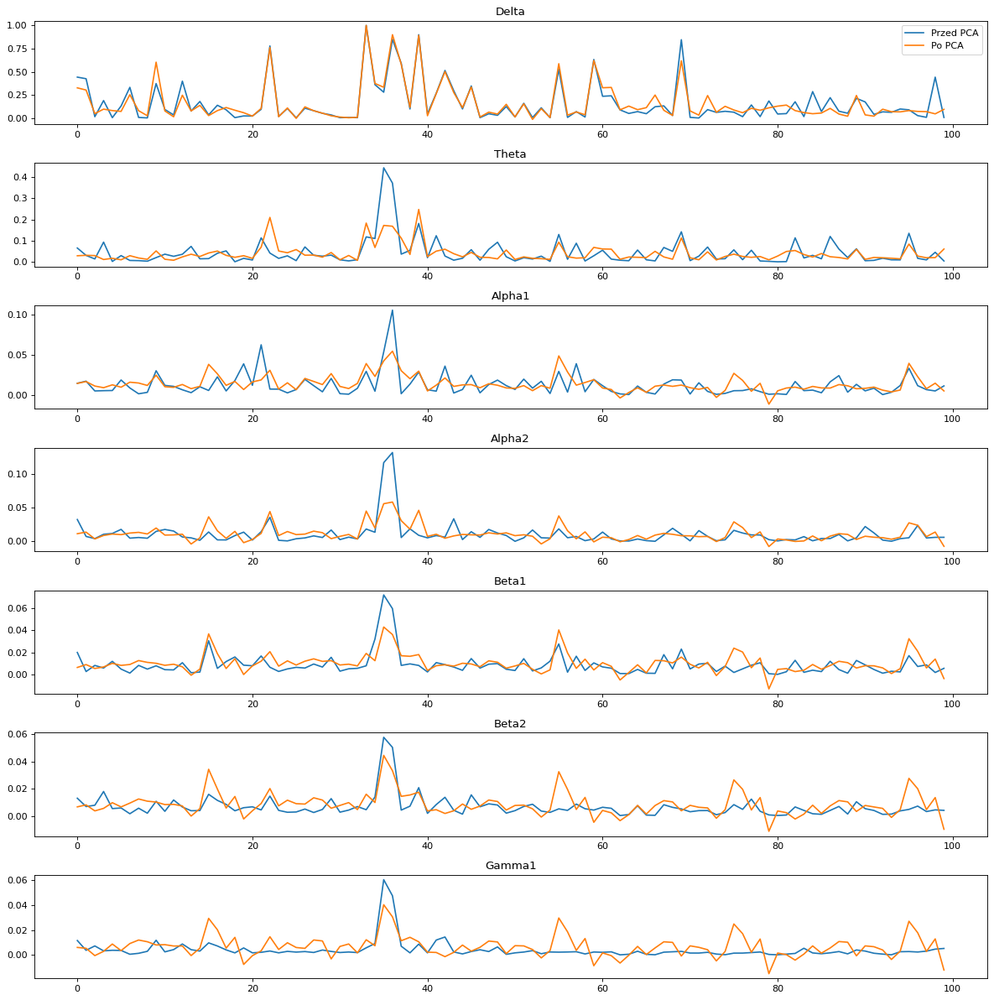

In [ ]:
wykonaj_PCA(student1_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.0
SNR: 28.404
PSNR: 64.683
Metryki dla sygnału Theta:
MSE: 0.0
SNR: 20.662
PSNR: 66.033
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 10.149
PSNR: 70.52
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 6.727
PSNR: 71.082
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 7.805
PSNR: 69.708
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 8.177
PSNR: 70.734
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 7.694
PSNR: 72.894


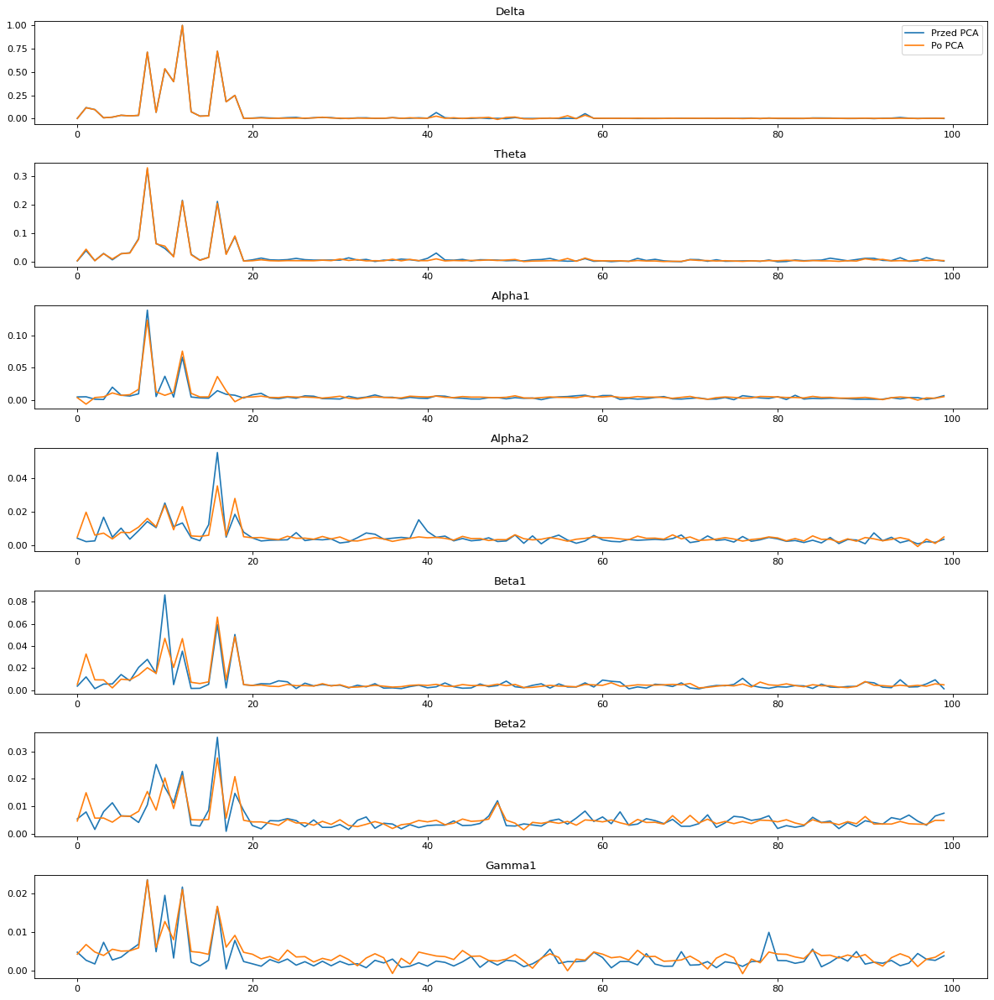

In [ ]:
wykonaj_PCA(student2_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.009
SNR: 12.845
PSNR: 55.863
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.35
PSNR: 59.239
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 4.297
PSNR: 65.998
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.013
PSNR: 68.068
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.303
PSNR: 68.365
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: -0.076
PSNR: 70.073
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: -5.354
PSNR: 72.634


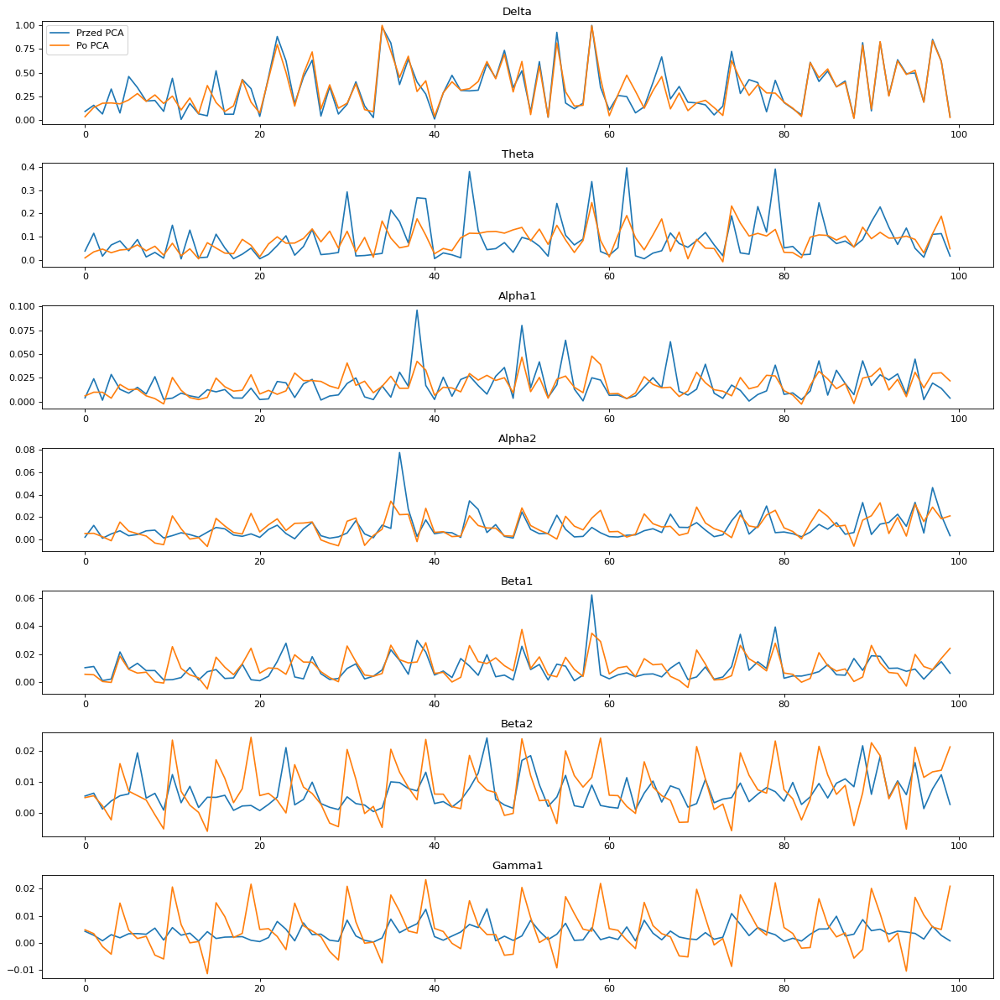

In [ ]:
wykonaj_PCA(student3_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.01
SNR: 8.015
PSNR: 60.357
Metryki dla sygnału Theta:
MSE: 0.004
SNR: 3.633
PSNR: 61.708
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 2.777
PSNR: 67.406
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.122
PSNR: 68.125
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 2.7
PSNR: 69.164
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 2.73
PSNR: 69.184
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 0.836
PSNR: 71.213


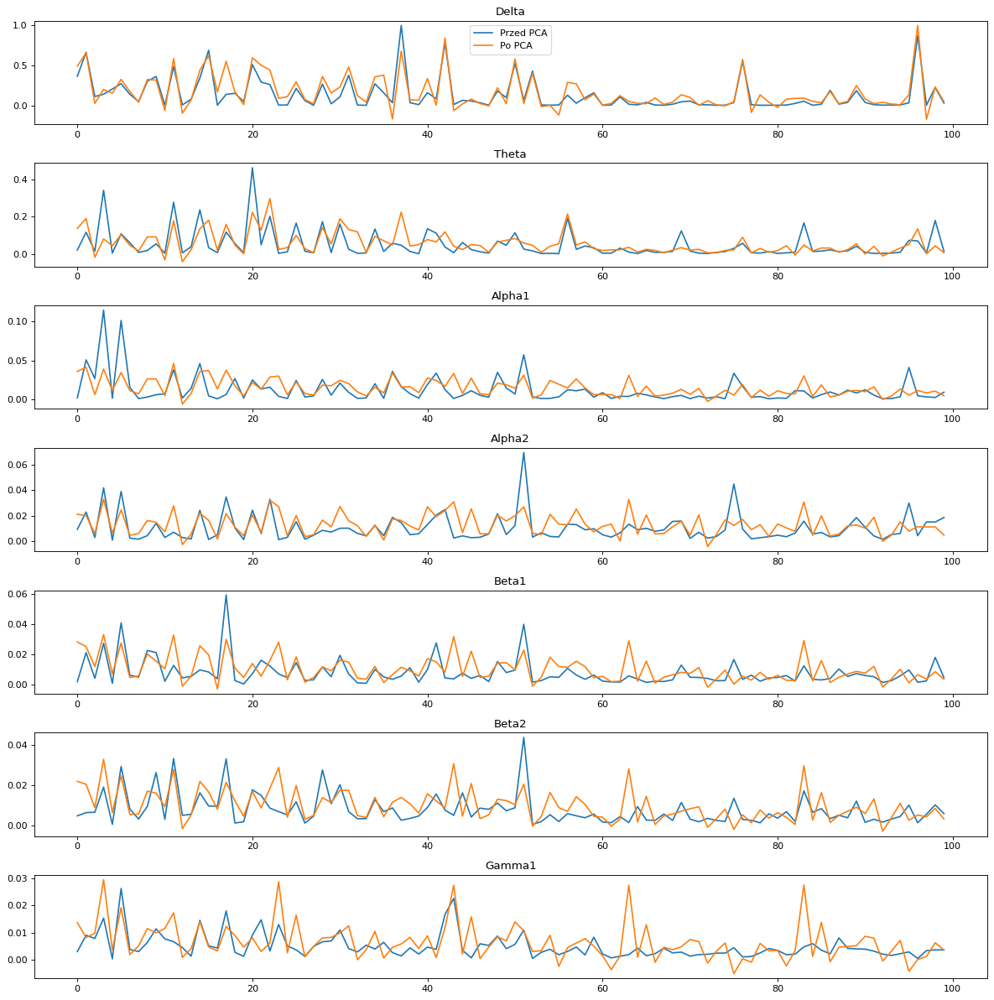

In [ ]:
wykonaj_PCA(student4_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.011
SNR: 11.321
PSNR: 55.833
Metryki dla sygnału Theta:
MSE: 0.011
SNR: 4.935
PSNR: 58.398
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.852
PSNR: 63.36
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 4.004
PSNR: 65.427
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.307
PSNR: 66.63
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 3.75
PSNR: 68.101
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 0.566
PSNR: 70.485


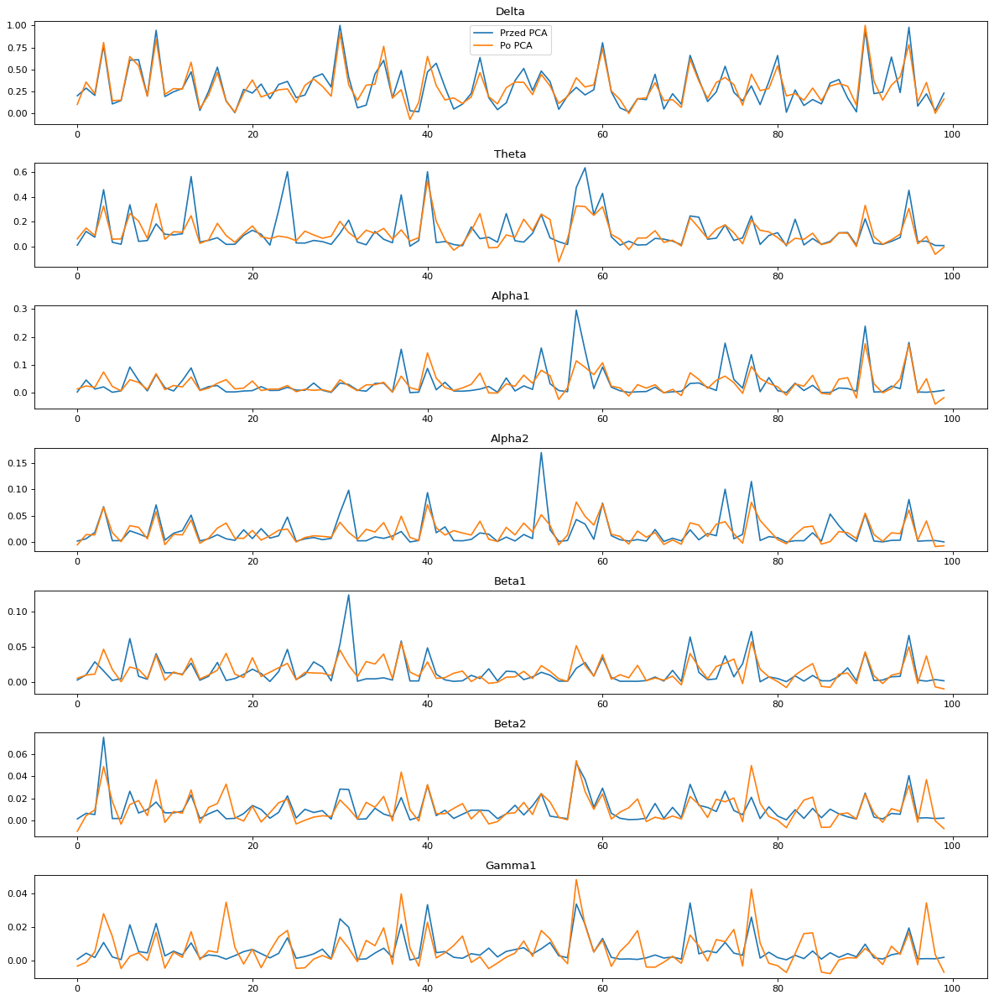

In [ ]:
wykonaj_PCA(student5_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.013
SNR: 10.519
PSNR: 55.513
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.52
PSNR: 59.239
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 3.297
PSNR: 65.45
Metryki dla sygnału Alpha2:
MSE: 0.001
SNR: 4.882
PSNR: 63.196
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 5.548
PSNR: 64.956
Metryki dla sygnału Beta2:
MSE: 0.002
SNR: 4.755
PSNR: 60.891
Metryki dla sygnału Gamma1:
MSE: 0.004
SNR: 3.576
PSNR: 60.595


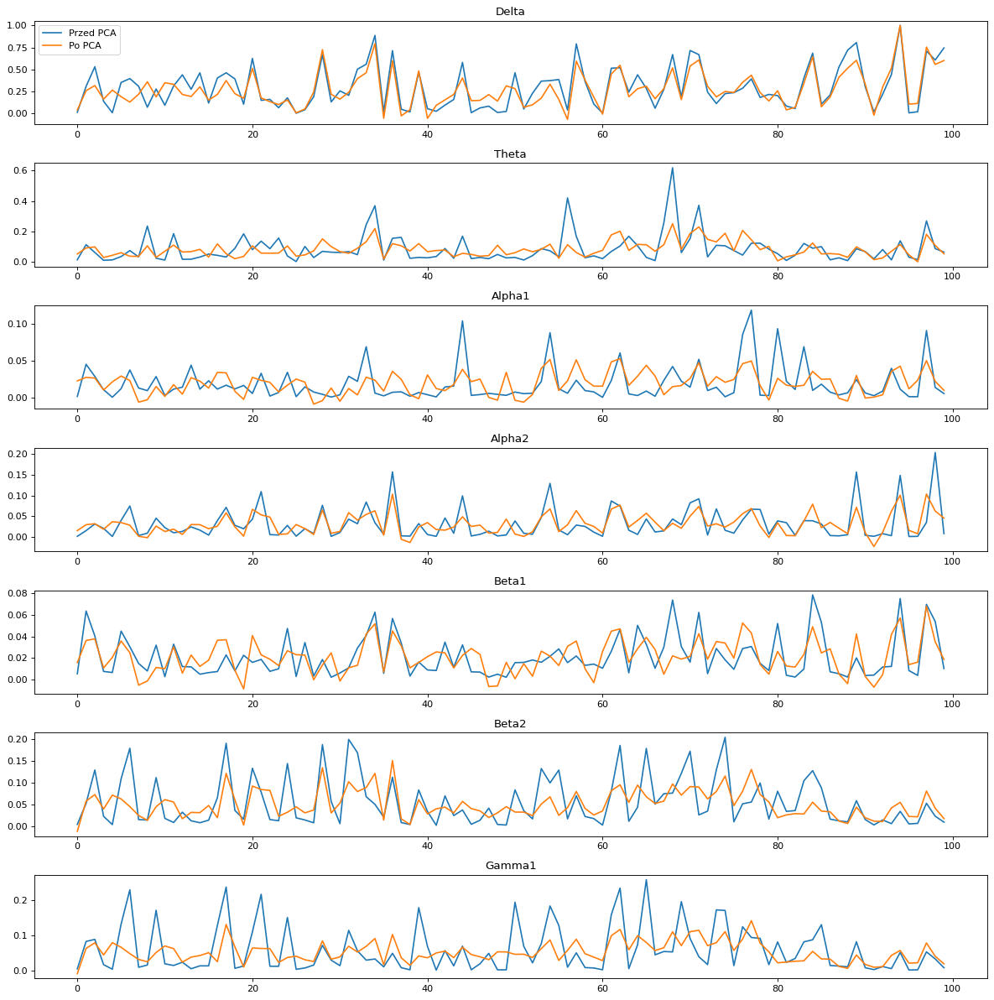

In [ ]:
wykonaj_PCA(student6_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.007
SNR: 12.493
PSNR: 55.993
Metryki dla sygnału Theta:
MSE: 0.003
SNR: 4.354
PSNR: 60.533
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 3.274
PSNR: 66.68
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.758
PSNR: 68.307
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.392
PSNR: 69.967
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 4.14
PSNR: 69.07
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 3.264
PSNR: 69.246


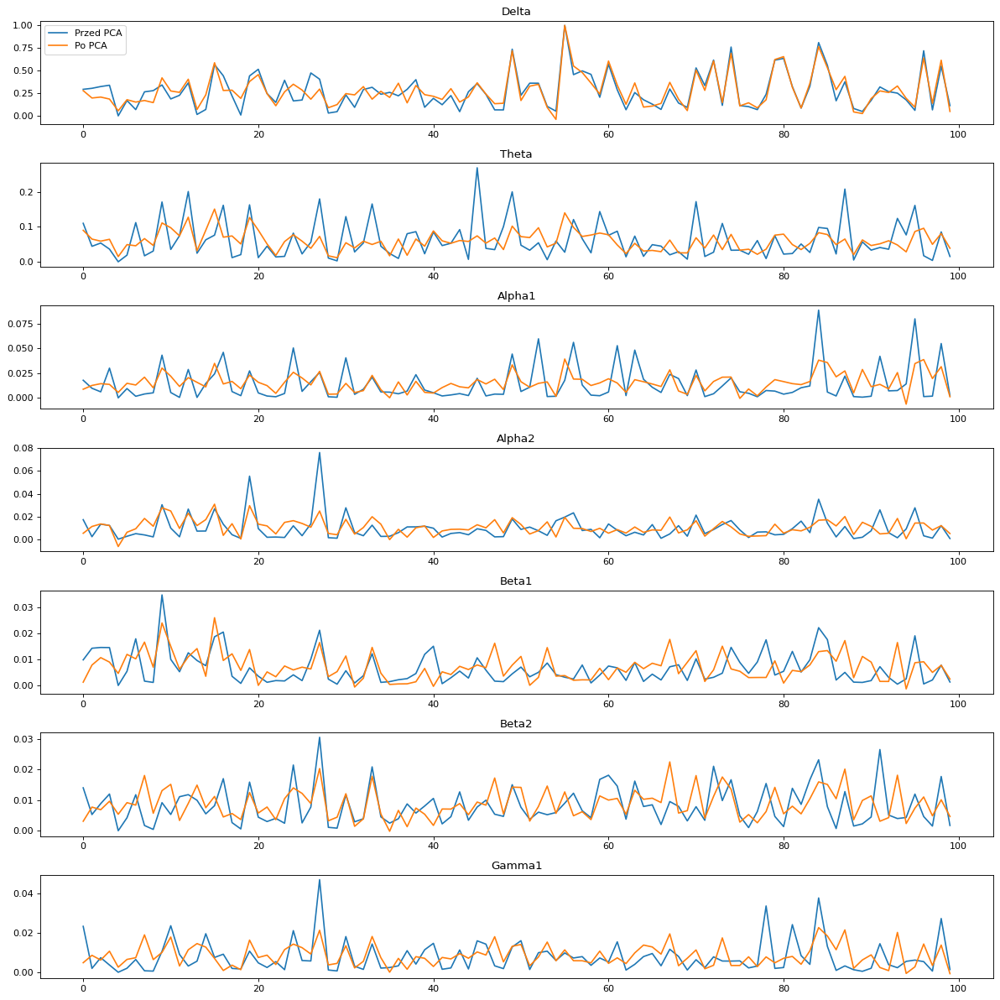

In [ ]:
wykonaj_PCA(student7_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.021
SNR: 9.946
PSNR: 57.283
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.804
PSNR: 59.016
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 3.861
PSNR: 63.117
Metryki dla sygnału Alpha2:
MSE: 0.001
SNR: 2.867
PSNR: 64.784
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 2.911
PSNR: 66.692
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 2.246
PSNR: 67.1
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: -0.889
PSNR: 69.964


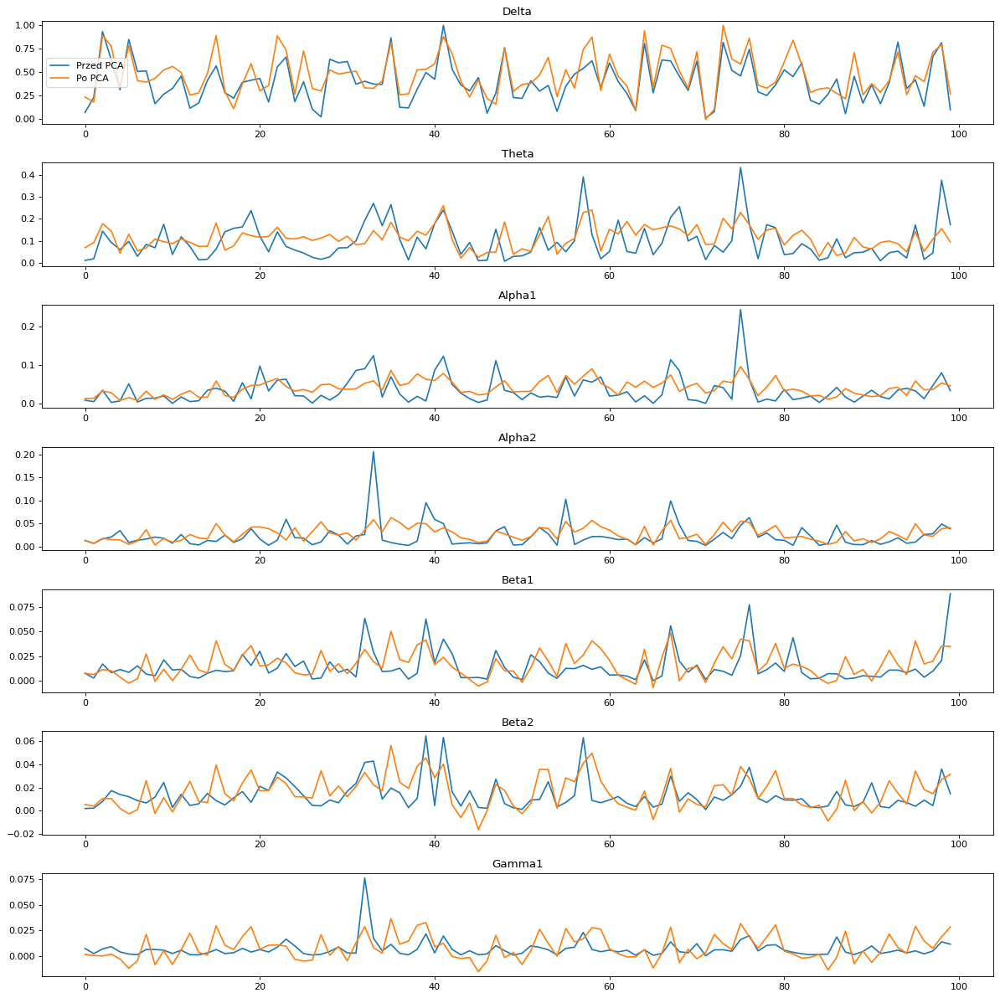

In [ ]:
wykonaj_PCA(student8_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.009
SNR: 11.551
PSNR: 55.606
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.647
PSNR: 58.78
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.29
PSNR: 64.408
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.663
PSNR: 66.746
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.262
PSNR: 68.221
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 4.477
PSNR: 66.923
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 4.593
PSNR: 65.695


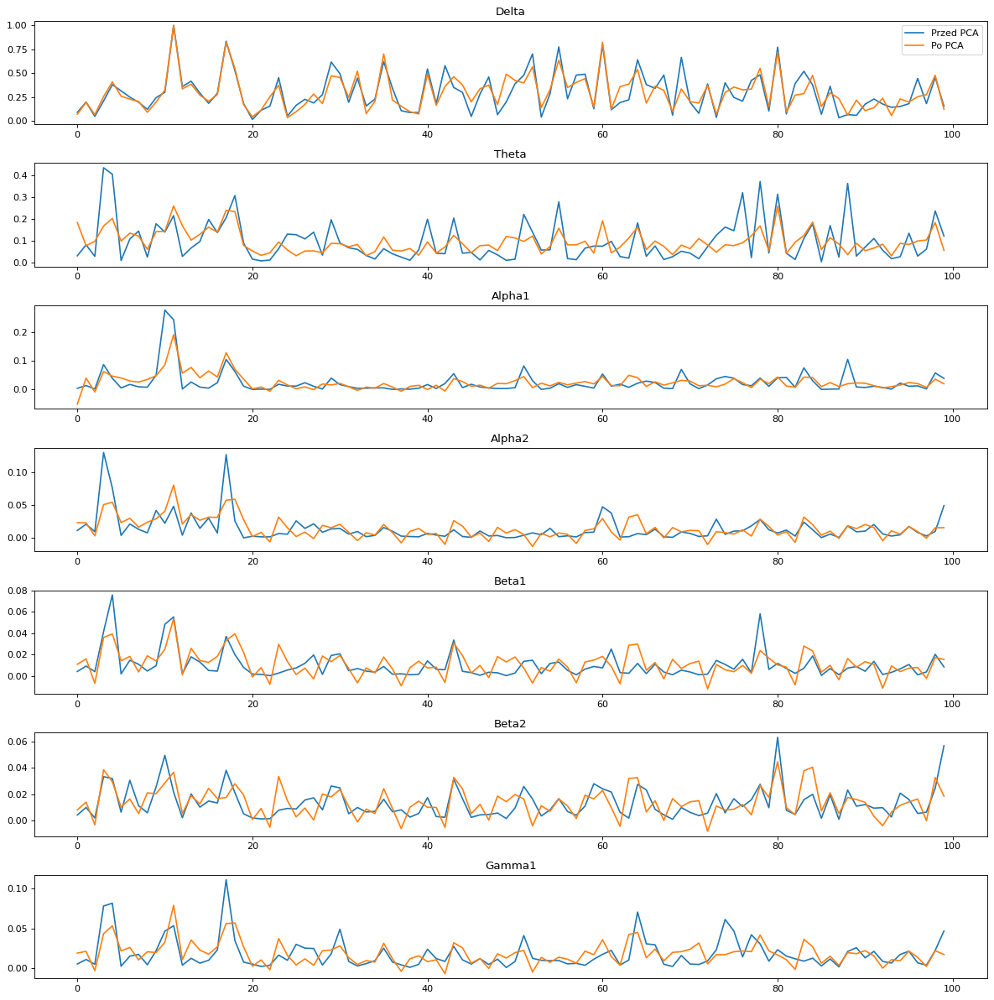

In [ ]:
wykonaj_PCA(student9_cut, 3)

# ICA

In [ ]:
from sklearn.decomposition import FastICA

def wykonaj_ICA(signal, n_components):
  ica = FastICA(n_components)
  ica = ica.fit(signal)

  components = ica.transform(signal)
  pred = ica.inverse_transform(components)

  signal_ravel = np.concatenate(signal).ravel().tolist()
  ica_signal_ravel = np.concatenate(pred).ravel().tolist()


  norm_signal = [float(i)/max(signal_ravel) for i in signal_ravel]
  norm_ica_signal = [float(i)/max(ica_signal_ravel) for i in ica_signal_ravel]


  plt.figure(figsize=(15, 15), dpi=80)

  plt.subplot(7,1,1)
  plt.plot(norm_signal[:100])
  plt.plot(norm_ica_signal[:100])
  plt.title('Delta')
  plt.legend(["Przed ICA", "Po ICA"])


  plt.subplot(7,1,2)
  plt.plot(norm_signal[100:200])
  plt.plot(norm_ica_signal[100:200])
  plt.title('Theta')


  plt.subplot(7,1,3)
  plt.plot(norm_signal[200:300])
  plt.plot(norm_ica_signal[200:300])
  plt.title('Alpha1')


  plt.subplot(7,1,4)
  plt.plot(norm_signal[300:400])
  plt.plot(norm_ica_signal[300:400])
  plt.title('Alpha2')


  plt.subplot(7,1,5)
  plt.plot(norm_signal[400:500])
  plt.plot(norm_ica_signal[400:500])
  plt.title('Beta1')


  plt.subplot(7,1,6)
  plt.plot(norm_signal[500:600])
  plt.plot(norm_ica_signal[500:600])
  plt.title('Beta2')


  plt.subplot(7,1,7)
  plt.plot(norm_signal[600:700])
  plt.plot(norm_ica_signal[600:700])
  plt.title('Gamma1')


  plt.xlim()
  plt.tight_layout()
  
  print("Metryki dla sygnału Delta:")
  print("MSE:", round(mse(norm_signal[:100], norm_ica_signal[:100]),3))
  print("SNR:", round(snr(norm_signal[:100], norm_ica_signal[:100]),3))
  print("PSNR:", round(psnr(norm_signal[:100], norm_ica_signal[:100]),3))
  print("Metryki dla sygnału Theta:")
  print("MSE:", round(mse(norm_signal[100:200], norm_ica_signal[100:200]),3))
  print("SNR:", round(snr(norm_signal[100:200], norm_ica_signal[100:200]),3))
  print("PSNR:", round(psnr(norm_signal[100:200], norm_ica_signal[100:200]),3))
  print("Metryki dla sygnału Alpha1:")
  print("MSE:", round(mse(norm_signal[200:300], norm_ica_signal[200:300]),3))
  print("SNR:", round(snr(norm_signal[200:300], norm_ica_signal[200:300]),3))
  print("PSNR:", round(psnr(norm_signal[200:300], norm_ica_signal[200:300]),3))
  print("Metryki dla sygnału Alpha2:")
  print("MSE:", round(mse(norm_signal[300:400], norm_ica_signal[300:400]),3))
  print("SNR:", round(snr(norm_signal[300:400], norm_ica_signal[300:400]),3))
  print("PSNR:", round(psnr(norm_signal[300:400], norm_ica_signal[300:400]),3))
  print("Metryki dla sygnału Beta1:")
  print("MSE:", round(mse(norm_signal[400:500], norm_ica_signal[400:500]),3))
  print("SNR:", round(snr(norm_signal[400:500], norm_ica_signal[400:500]),3))
  print("PSNR:", round(psnr(norm_signal[400:500], norm_ica_signal[400:500]),3))
  print("Metryki dla sygnału Beta2:")
  print("MSE:", round(mse(norm_signal[500:600], norm_ica_signal[500:600]),3))
  print("SNR:", round(snr(norm_signal[500:600], norm_ica_signal[500:600]),3))
  print("PSNR:", round(psnr(norm_signal[500:600], norm_ica_signal[500:600]),3))
  print("Metryki dla sygnału Gamma1:")
  print("MSE:", round(mse(norm_signal[600:700], norm_ica_signal[600:700]),3))
  print("SNR:", round(snr(norm_signal[600:700], norm_ica_signal[600:700]),3))
  print("PSNR:", round(psnr(norm_signal[600:700], norm_ica_signal[600:700]),3))

## ICA dla wszystkich studentów

Metryki dla sygnału Delta:
MSE: 0.018
SNR: 8.585
PSNR: 55.619
Metryki dla sygnału Theta:
MSE: 0.007
SNR: 4.396
PSNR: 58.808
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.243
PSNR: 64.428
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.382
PSNR: 66.753
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 2.667
PSNR: 68.224
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 3.892
PSNR: 66.927
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 4.087
PSNR: 65.699


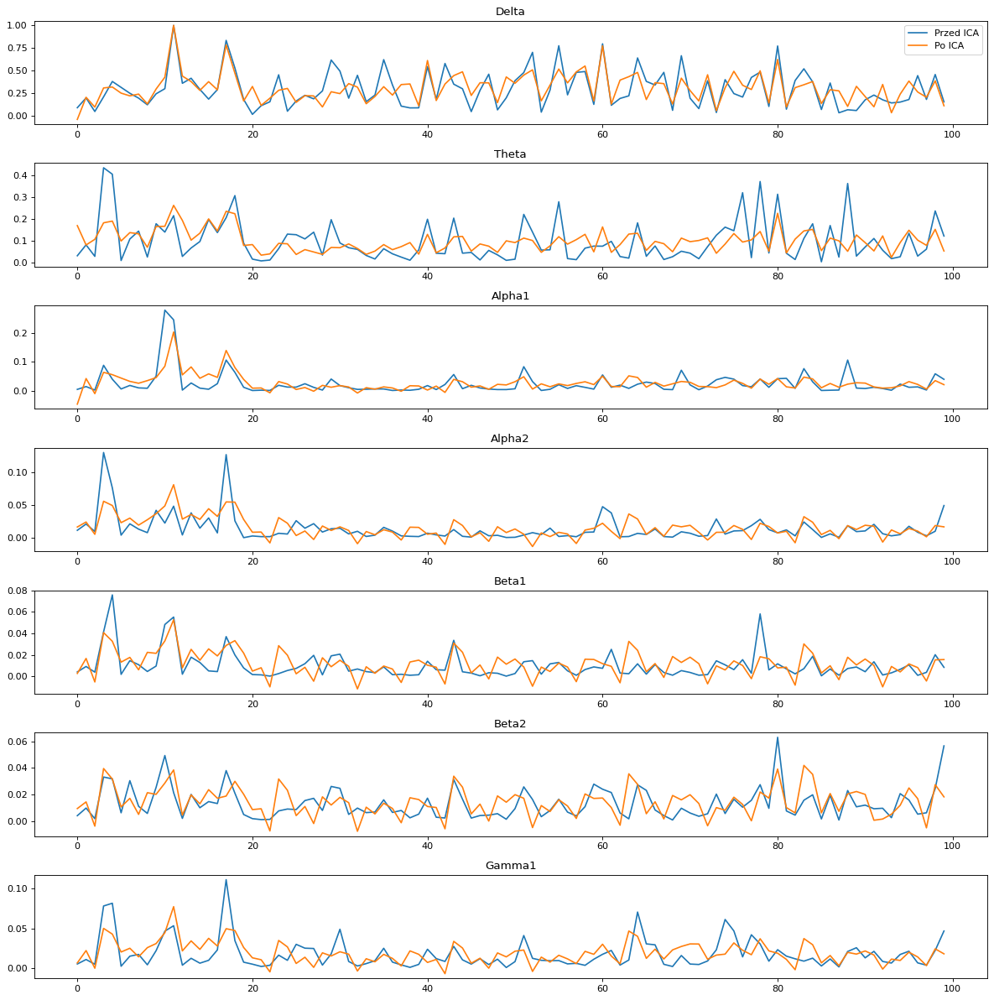

In [ ]:
wykonaj_ICA(student0_cut, 2)

Metryki dla sygnału Delta:
MSE: 0.006
SNR: 10.904
PSNR: 58.363
Metryki dla sygnału Theta:
MSE: 0.002
SNR: 4.026
PSNR: 61.909
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 3.994
PSNR: 67.381
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.793
PSNR: 67.869
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 4.416
PSNR: 68.706
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 2.498
PSNR: 69.861
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 0.095
PSNR: 71.941


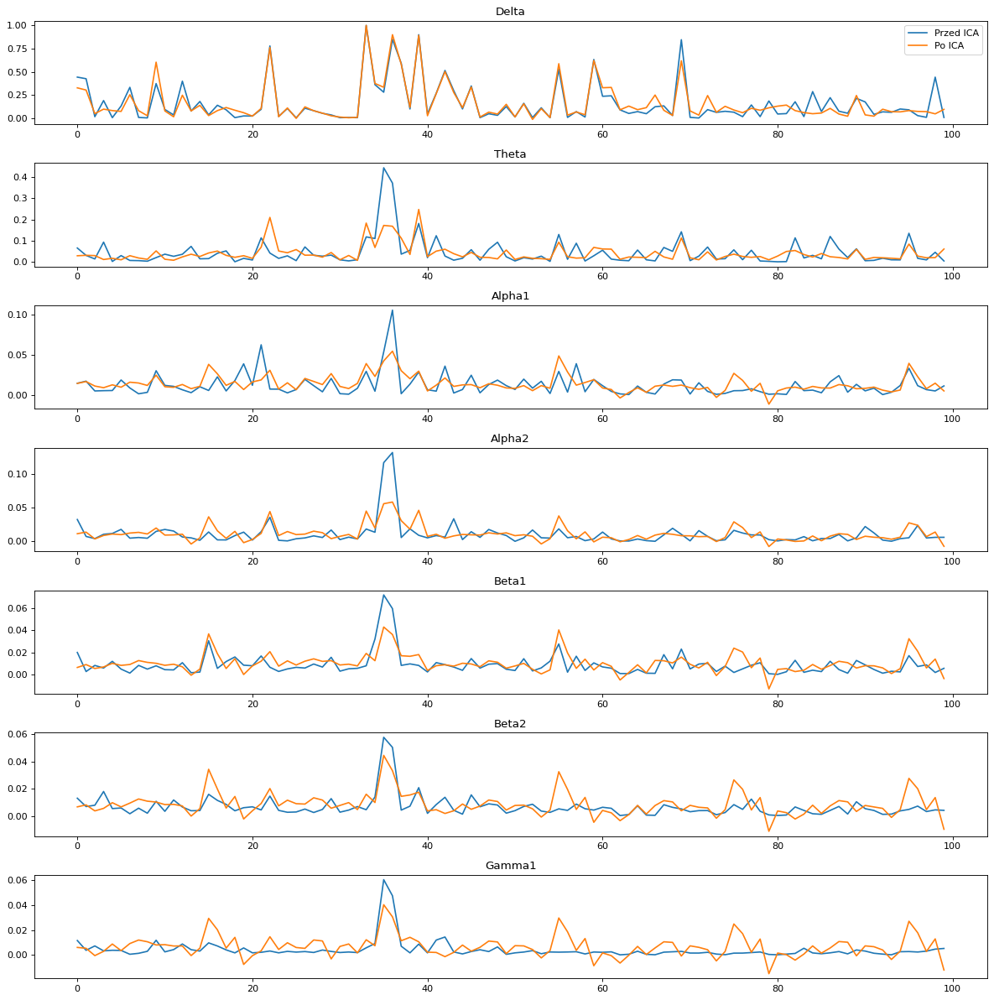

In [ ]:
wykonaj_ICA(student1_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.0
SNR: 28.404
PSNR: 64.683
Metryki dla sygnału Theta:
MSE: 0.0
SNR: 20.662
PSNR: 66.033
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 10.149
PSNR: 70.52
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 6.727
PSNR: 71.082
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 7.805
PSNR: 69.708
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 8.177
PSNR: 70.734
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 7.694
PSNR: 72.894


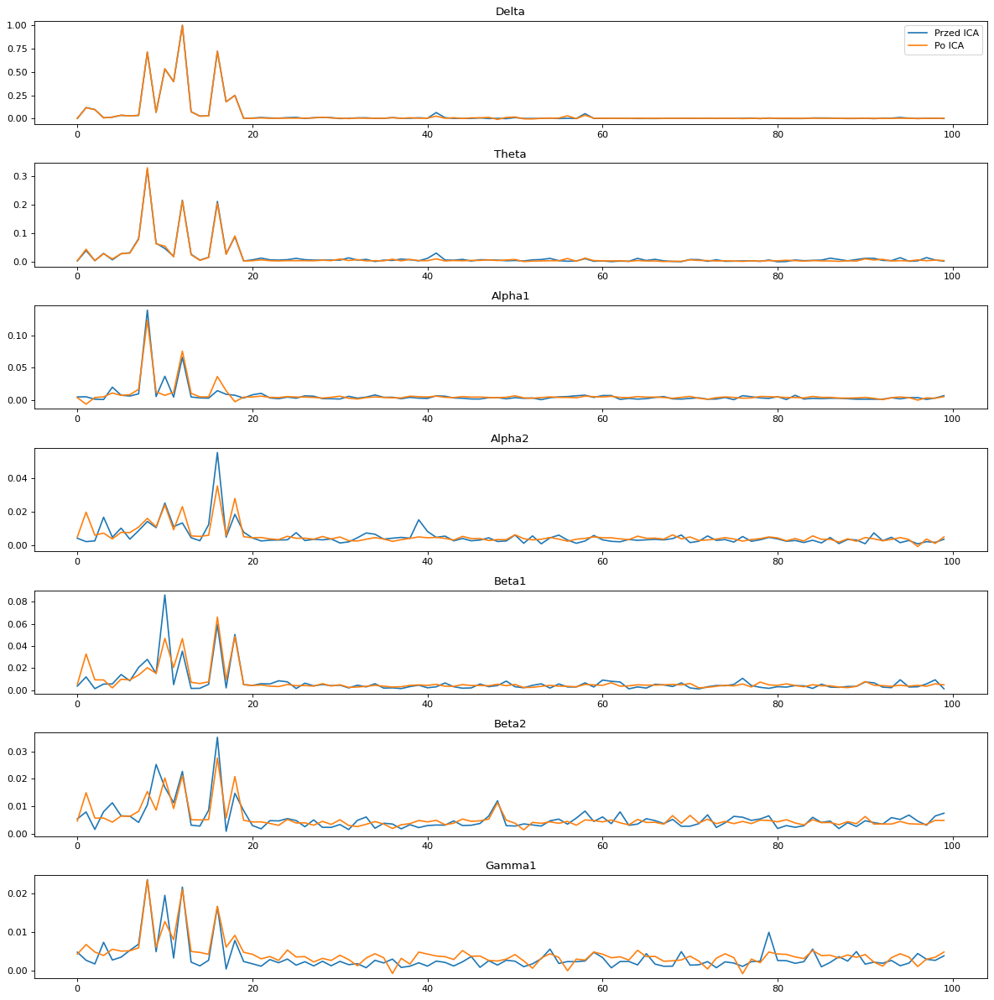

In [ ]:
wykonaj_ICA(student2_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.0
SNR: 27.315
PSNR: 56.037
Metryki dla sygnału Theta:
MSE: 0.004
SNR: 5.358
PSNR: 59.299
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 5.089
PSNR: 66.0
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 4.095
PSNR: 68.057
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 4.754
PSNR: 68.356
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 1.264
PSNR: 70.053
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: -3.133
PSNR: 72.595


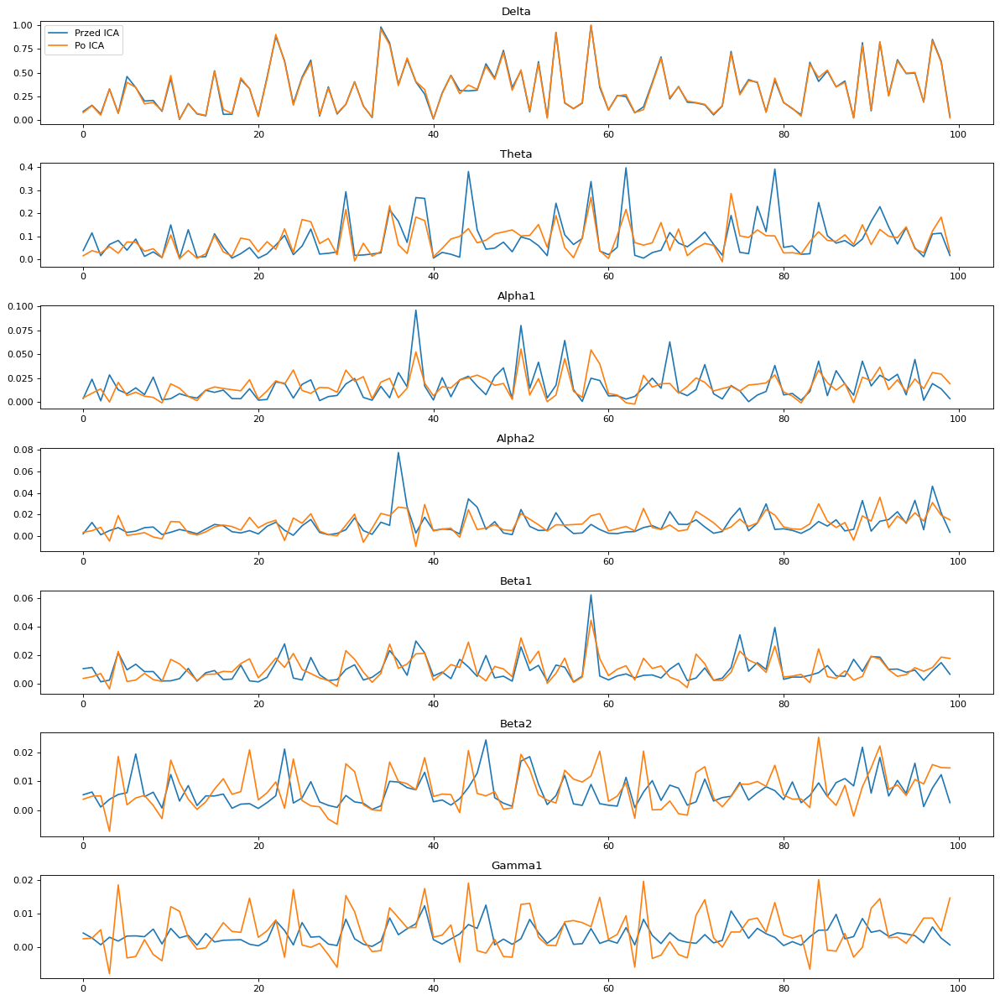

In [ ]:
wykonaj_ICA(student3_cut, 5)

Metryki dla sygnału Delta:
MSE: 0.01
SNR: 8.015
PSNR: 60.357
Metryki dla sygnału Theta:
MSE: 0.004
SNR: 3.633
PSNR: 61.708
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 2.777
PSNR: 67.406
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.122
PSNR: 68.125
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 2.7
PSNR: 69.164
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 2.73
PSNR: 69.184
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 0.836
PSNR: 71.213


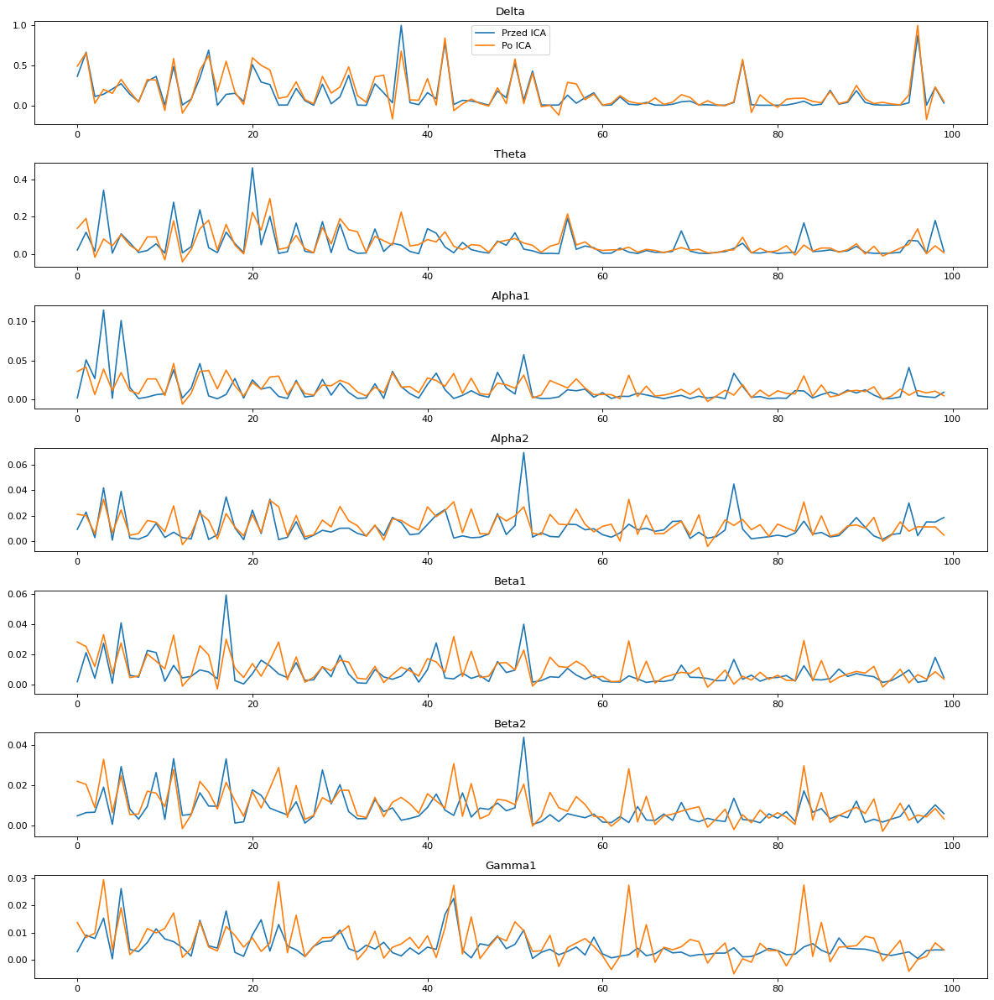

In [ ]:
wykonaj_ICA(student4_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.011
SNR: 11.321
PSNR: 55.833
Metryki dla sygnału Theta:
MSE: 0.011
SNR: 4.935
PSNR: 58.398
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.852
PSNR: 63.36
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 4.004
PSNR: 65.427
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.307
PSNR: 66.63
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 3.75
PSNR: 68.101
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 0.566
PSNR: 70.485


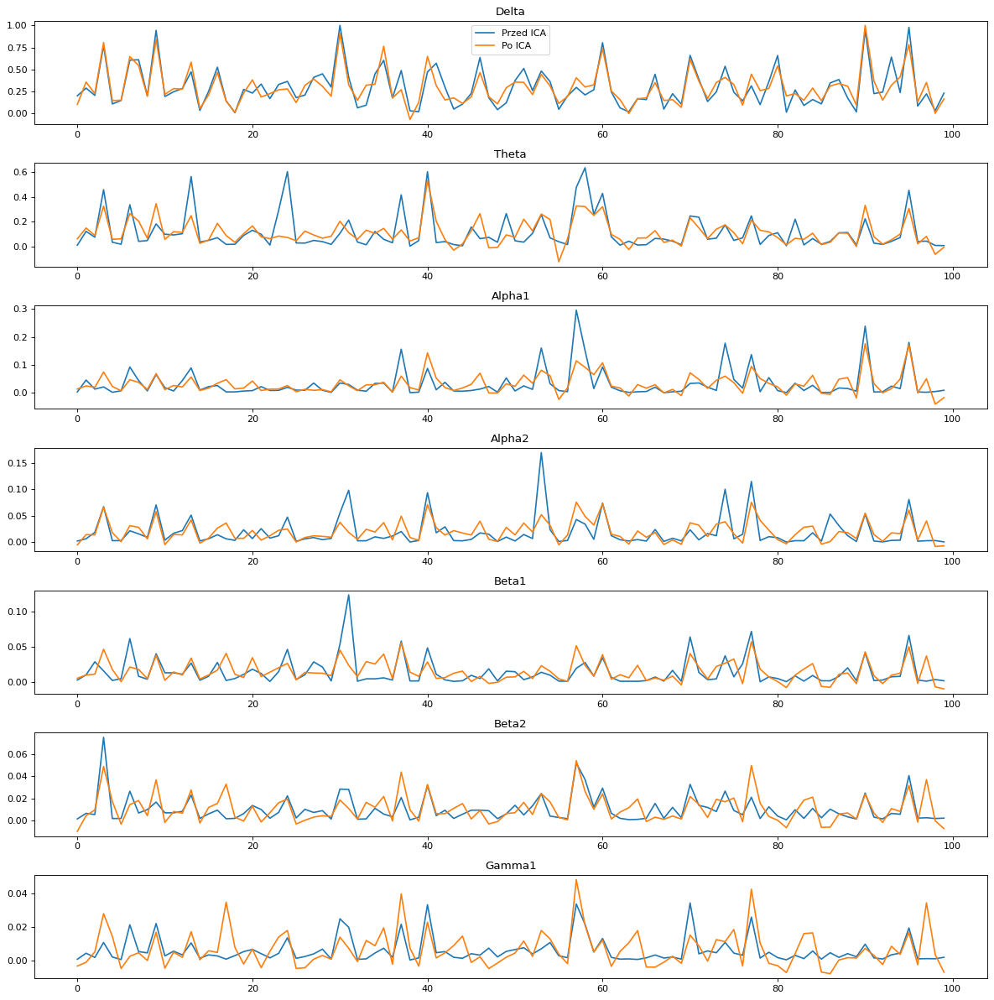

In [ ]:
wykonaj_ICA(student5_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.013
SNR: 10.519
PSNR: 55.513
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.52
PSNR: 59.239
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 3.297
PSNR: 65.45
Metryki dla sygnału Alpha2:
MSE: 0.001
SNR: 4.882
PSNR: 63.196
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 5.548
PSNR: 64.956
Metryki dla sygnału Beta2:
MSE: 0.002
SNR: 4.755
PSNR: 60.891
Metryki dla sygnału Gamma1:
MSE: 0.004
SNR: 3.576
PSNR: 60.595


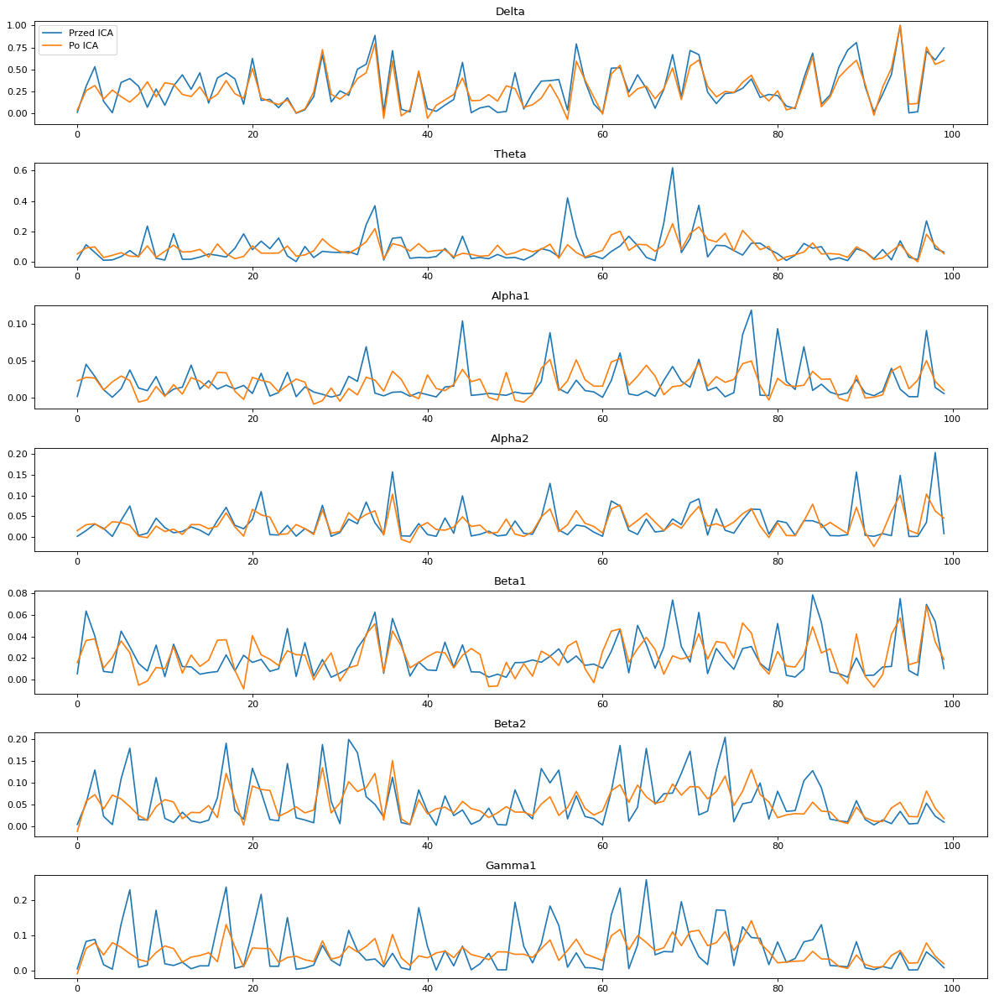

In [ ]:
wykonaj_ICA(student6_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.007
SNR: 12.493
PSNR: 55.993
Metryki dla sygnału Theta:
MSE: 0.003
SNR: 4.354
PSNR: 60.533
Metryki dla sygnału Alpha1:
MSE: 0.0
SNR: 3.274
PSNR: 66.68
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.758
PSNR: 68.307
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.392
PSNR: 69.967
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 4.14
PSNR: 69.07
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 3.264
PSNR: 69.246


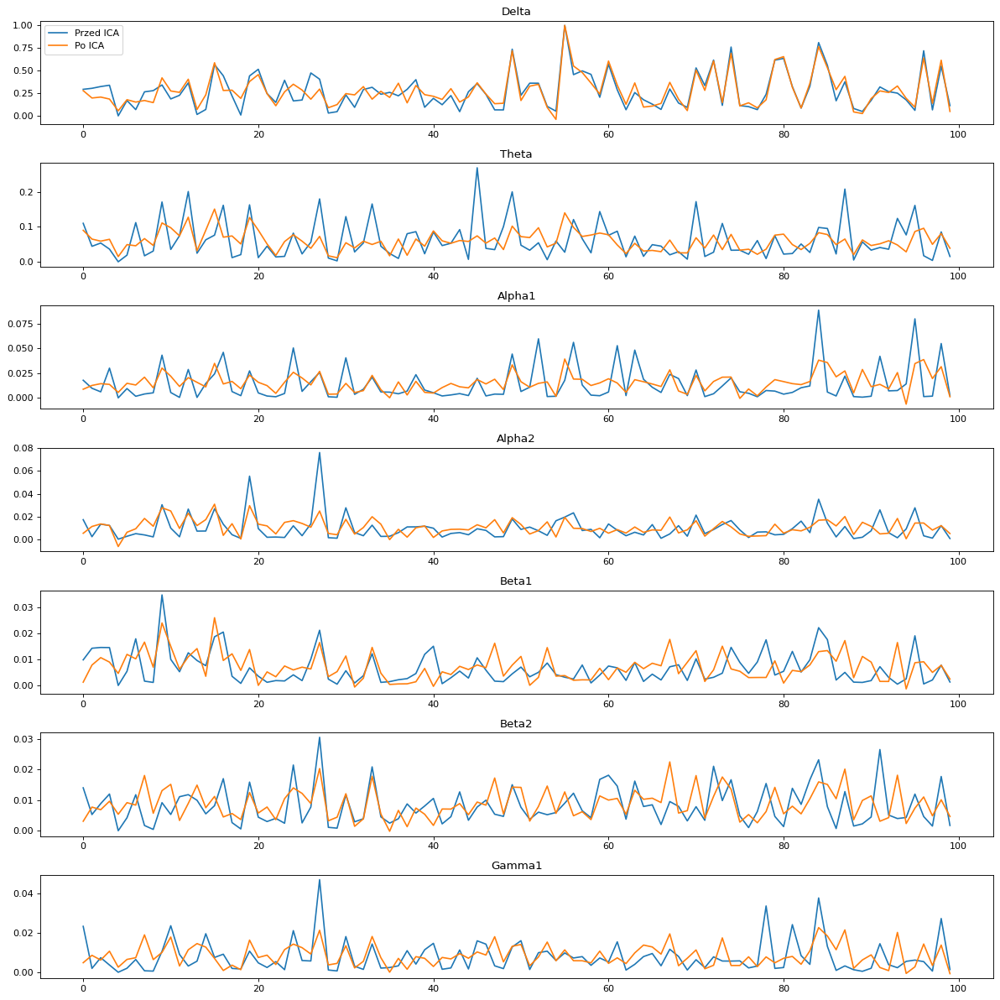

In [ ]:
wykonaj_ICA(student7_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.021
SNR: 9.946
PSNR: 57.283
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.804
PSNR: 59.016
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 3.861
PSNR: 63.117
Metryki dla sygnału Alpha2:
MSE: 0.001
SNR: 2.867
PSNR: 64.784
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 2.911
PSNR: 66.692
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 2.246
PSNR: 67.1
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: -0.889
PSNR: 69.964


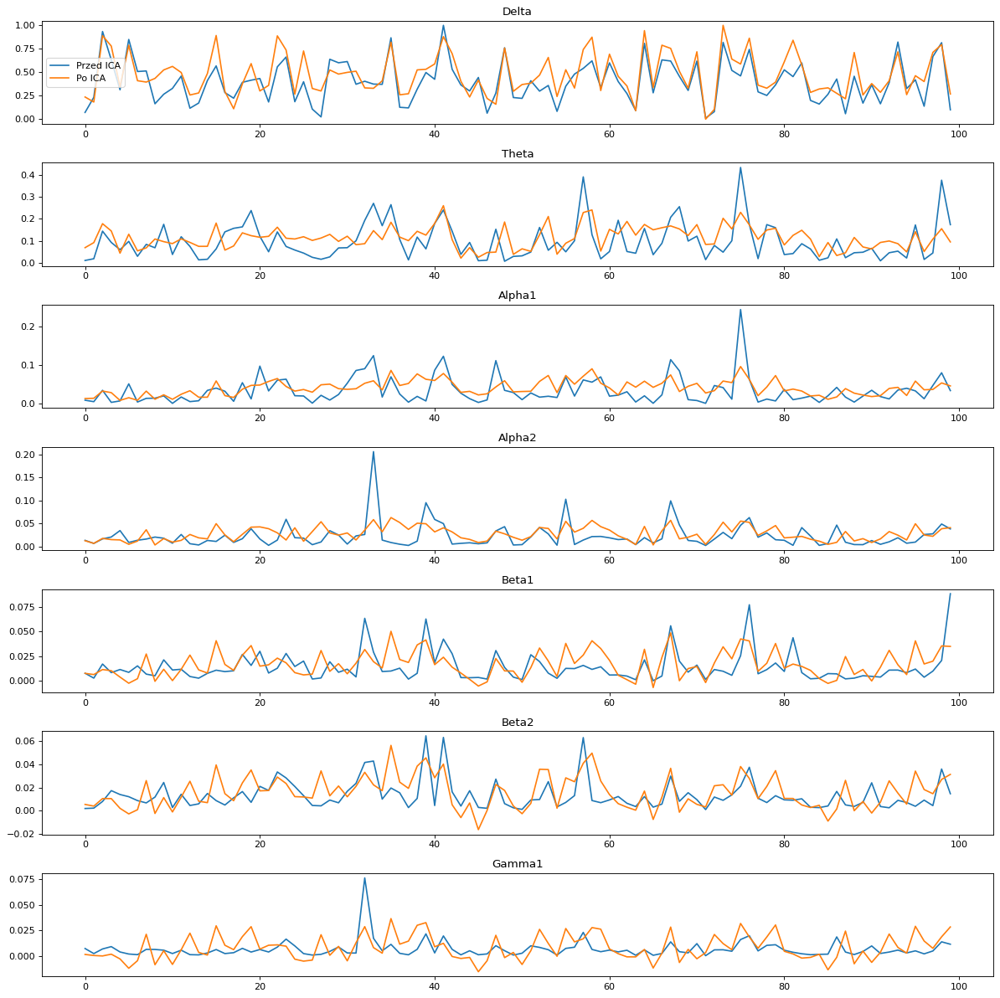

In [ ]:
wykonaj_ICA(student8_cut, 3)

Metryki dla sygnału Delta:
MSE: 0.009
SNR: 11.551
PSNR: 55.606
Metryki dla sygnału Theta:
MSE: 0.006
SNR: 4.647
PSNR: 58.78
Metryki dla sygnału Alpha1:
MSE: 0.001
SNR: 4.29
PSNR: 64.408
Metryki dla sygnału Alpha2:
MSE: 0.0
SNR: 3.663
PSNR: 66.746
Metryki dla sygnału Beta1:
MSE: 0.0
SNR: 3.262
PSNR: 68.221
Metryki dla sygnału Beta2:
MSE: 0.0
SNR: 4.477
PSNR: 66.923
Metryki dla sygnału Gamma1:
MSE: 0.0
SNR: 4.593
PSNR: 65.695


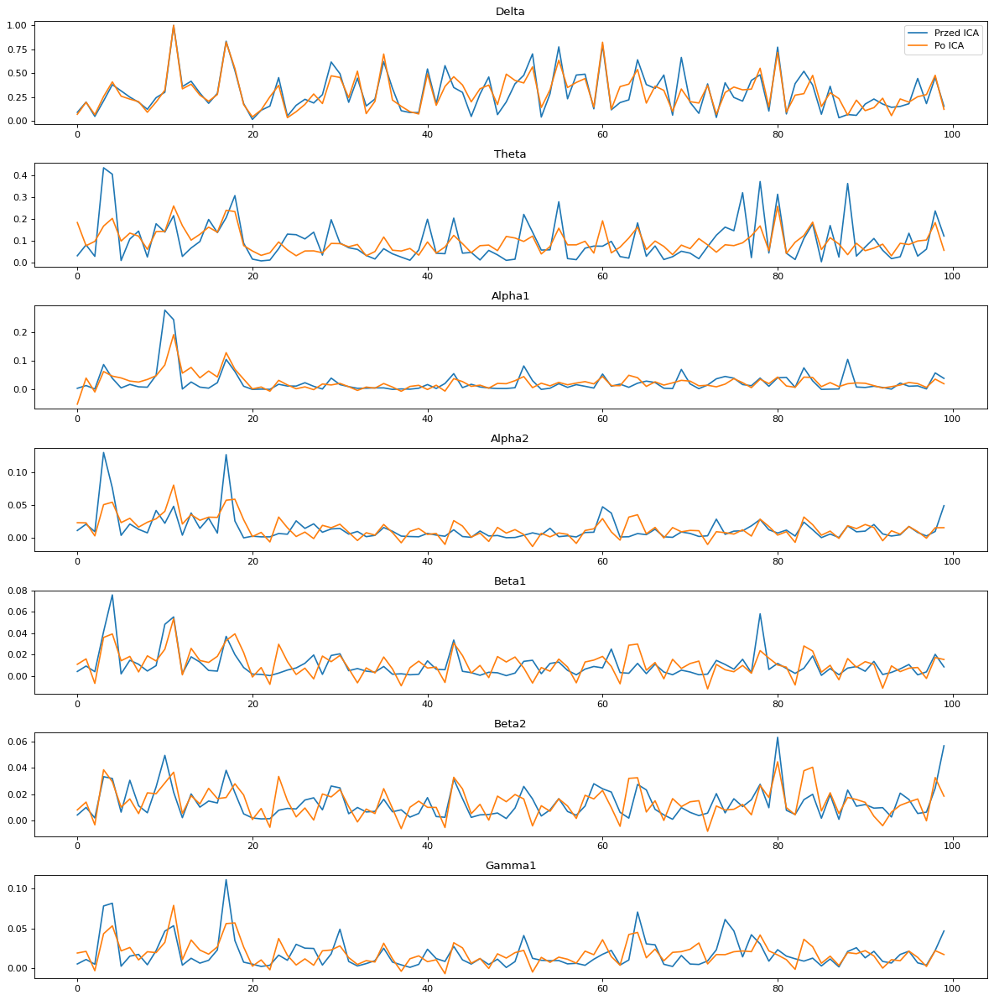

In [ ]:
wykonaj_ICA(student9_cut, 3)